In [1]:
import pandas as pd
import numpy as np
from sklearn import metrics
import matplotlib.pyplot as plt
import seaborn as sns
sns.set (style="white")
sns.set (style="whitegrid", color_codes=True)
%matplotlib inline
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeClassifier
from IPython.display import Image
import pydotplus as pydot
import graphviz
from IPython.display import display
from sklearn import tree
from os import system
from sklearn.preprocessing import LabelEncoder
from sklearn import preprocessing
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import confusion_matrix, recall_score, precision_score, f1_score, roc_auc_score,accuracy_score,roc_curve
from sklearn.metrics import classification_report
from sklearn.model_selection import RandomizedSearchCV
from sklearn.tree import export_graphviz
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import BaggingClassifier
from sklearn.ensemble import AdaBoostClassifier

In [2]:
#Read the CSV file
Bank_DF=pd.read_csv('bank-full.csv')

In [3]:
Bank_DF.head(10)

,age,job,marital,education,default,balance,housing,loan,contact,day,month,duration,campaign,pdays,previous,poutcome,Target
0,58,management,married,tertiary,no,2143,yes,no,unknown,5,may,261,1,-1,0,unknown,no
1,44,technician,single,secondary,no,29,yes,no,unknown,5,may,151,1,-1,0,unknown,no
2,33,entrepreneur,married,secondary,no,2,yes,yes,unknown,5,may,76,1,-1,0,unknown,no
3,47,blue-collar,married,unknown,no,1506,yes,no,unknown,5,may,92,1,-1,0,unknown,no
4,33,unknown,single,unknown,no,1,no,no,unknown,5,may,198,1,-1,0,unknown,no
5,35,management,married,tertiary,no,231,yes,no,unknown,5,may,139,1,-1,0,unknown,no
6,28,management,single,tertiary,no,447,yes,yes,unknown,5,may,217,1,-1,0,unknown,no
7,42,entrepreneur,divorced,tertiary,yes,2,yes,no,unknown,5,may,380,1,-1,0,unknown,no
8,58,retired,married,primary,no,121,yes,no,unknown,5,may,50,1,-1,0,unknown,no
9,43,technician,single,secondary,no,593,yes,no,unknown,5,may,55,1,-1,0,unknown,no


In [4]:
Bank_DF.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 45211 entries, 0 to 45210
Data columns (total 17 columns):
 #   Column     Non-Null Count  Dtype 
---  ------     --------------  ----- 
 0   age        45211 non-null  int64 
 1   job        45211 non-null  object
 2   marital    45211 non-null  object
 3   education  45211 non-null  object
 4   default    45211 non-null  object
 5   balance    45211 non-null  int64 
 6   housing    45211 non-null  object
 7   loan       45211 non-null  object
 8   contact    45211 non-null  object
 9   day        45211 non-null  int64 
 10  month      45211 non-null  object
 11  duration   45211 non-null  int64 
 12  campaign   45211 non-null  int64 
 13  pdays      45211 non-null  int64 
 14  previous   45211 non-null  int64 
 15  poutcome   45211 non-null  object
 16  Target     45211 non-null  object
dtypes: int64(7), object(10)
memory usage: 5.9+ MB


In [5]:
Bank_DF.tail(10)

,age,job,marital,education,default,balance,housing,loan,contact,day,month,duration,campaign,pdays,previous,poutcome,Target
45201,53,management,married,tertiary,no,583,no,no,cellular,17,nov,226,1,184,4,success,yes
45202,34,admin.,single,secondary,no,557,no,no,cellular,17,nov,224,1,-1,0,unknown,yes
45203,23,student,single,tertiary,no,113,no,no,cellular,17,nov,266,1,-1,0,unknown,yes
45204,73,retired,married,secondary,no,2850,no,no,cellular,17,nov,300,1,40,8,failure,yes
45205,25,technician,single,secondary,no,505,no,yes,cellular,17,nov,386,2,-1,0,unknown,yes
45206,51,technician,married,tertiary,no,825,no,no,cellular,17,nov,977,3,-1,0,unknown,yes
45207,71,retired,divorced,primary,no,1729,no,no,cellular,17,nov,456,2,-1,0,unknown,yes
45208,72,retired,married,secondary,no,5715,no,no,cellular,17,nov,1127,5,184,3,success,yes
45209,57,blue-collar,married,secondary,no,668,no,no,telephone,17,nov,508,4,-1,0,unknown,no
45210,37,entrepreneur,married,secondary,no,2971,no,no,cellular,17,nov,361,2,188,11,other,no


In [6]:
Bank_DF.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 45211 entries, 0 to 45210
Data columns (total 17 columns):
 #   Column     Non-Null Count  Dtype 
---  ------     --------------  ----- 
 0   age        45211 non-null  int64 
 1   job        45211 non-null  object
 2   marital    45211 non-null  object
 3   education  45211 non-null  object
 4   default    45211 non-null  object
 5   balance    45211 non-null  int64 
 6   housing    45211 non-null  object
 7   loan       45211 non-null  object
 8   contact    45211 non-null  object
 9   day        45211 non-null  int64 
 10  month      45211 non-null  object
 11  duration   45211 non-null  int64 
 12  campaign   45211 non-null  int64 
 13  pdays      45211 non-null  int64 
 14  previous   45211 non-null  int64 
 15  poutcome   45211 non-null  object
 16  Target     45211 non-null  object
dtypes: int64(7), object(10)
memory usage: 5.9+ MB


In [7]:
Bank_DF.isnull().sum()

age          0
job          0
marital      0
education    0
default      0
balance      0
housing      0
loan         0
contact      0
day          0
month        0
duration     0
campaign     0
pdays        0
previous     0
poutcome     0
Target       0
dtype: int64

In [8]:
Bank_DF.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
age,45211.0,40.936210,10.618762,18.0,33.0,39.0,48.0,95.0
balance,45211.0,1362.272058,3044.765829,-8019.0,72.0,448.0,1428.0,102127.0
day,45211.0,15.806419,8.322476,1.0,8.0,16.0,21.0,31.0
duration,45211.0,258.163080,257.527812,0.0,103.0,180.0,319.0,4918.0
campaign,45211.0,2.763841,3.098021,1.0,1.0,2.0,3.0,63.0
pdays,45211.0,40.197828,100.128746,-1.0,-1.0,-1.0,-1.0,871.0
previous,45211.0,0.580323,2.303441,0.0,0.0,0.0,0.0,275.0


In [9]:
Bank_DF.describe() 

,age,balance,day,duration,campaign,pdays,previous
count,45211.000000,45211.000000,45211.000000,45211.000000,45211.000000,45211.000000,45211.000000
mean,40.936210,1362.272058,15.806419,258.163080,2.763841,40.197828,0.580323
std,10.618762,3044.765829,8.322476,257.527812,3.098021,100.128746,2.303441
min,18.000000,-8019.000000,1.000000,0.000000,1.000000,-1.000000,0.000000
25%,33.000000,72.000000,8.000000,103.000000,1.000000,-1.000000,0.000000
50%,39.000000,448.000000,16.000000,180.000000,2.000000,-1.000000,0.000000
75%,48.000000,1428.000000,21.000000,319.000000,3.000000,-1.000000,0.000000
max,95.000000,102127.000000,31.000000,4918.000000,63.000000,871.000000,275.000000


In [10]:
Bank_DF.nunique()

age            77
job            12
marital         3
education       4
default         2
balance      7168
housing         2
loan            2
contact         3
day            31
month          12
duration     1573
campaign       48
pdays         559
previous       41
poutcome        4
Target          2
dtype: int64

In [11]:
#Convert to categorical data type

#Categoricals are a pandas data type corresponding to categorical variables in statistics. 
#A categorical variable takes on a limited, and usually fixed, number of possible values 
#A string variable consisting of only a few different values. 
#Converting such a string variable to a categorical variable will save some memory

Bank_DF['job']=Bank_DF['job'].astype('category')
Bank_DF['marital']=Bank_DF['marital'].astype('category')
Bank_DF['education']=Bank_DF['education'].astype('category')
Bank_DF['default']=Bank_DF['default'].astype('category')
Bank_DF['poutcome']=Bank_DF['poutcome'].astype('category')
Bank_DF['Target']=Bank_DF['Target'].astype('category')
Bank_DF['housing']=Bank_DF['housing'].astype('category')
Bank_DF['loan']=Bank_DF['loan'].astype('category')
Bank_DF['contact']=Bank_DF['contact'].astype('category')
Bank_DF['month']=Bank_DF['month'].astype('category')

# new category datatypes
Bank_DF.dtypes

age             int64
job          category
marital      category
education    category
default      category
balance         int64
housing      category
loan         category
contact      category
day             int64
month        category
duration        int64
campaign        int64
pdays           int64
previous        int64
poutcome     category
Target       category
dtype: object

In [12]:
#Deliverable – 1 (Exploratory data quality report reflecting the following) – (20)
#Univariate analysis (12 marks)

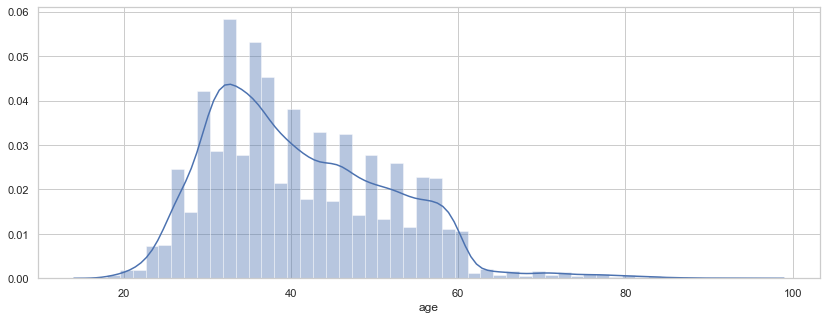

In [13]:
#Age
plt.figure(figsize=(14,5))
sns.distplot(Bank_DF['age']);

In [14]:
# Check unique values
Bank_DF['age'].unique()

array([58, 44, 33, 47, 35, 28, 42, 43, 41, 29, 53, 57, 51, 45, 60, 56, 32,
       25, 40, 39, 52, 46, 36, 49, 59, 37, 50, 54, 55, 48, 24, 38, 31, 30,
       27, 34, 23, 26, 61, 22, 21, 20, 66, 62, 83, 75, 67, 70, 65, 68, 64,
       69, 72, 71, 19, 76, 85, 63, 90, 82, 73, 74, 78, 80, 94, 79, 77, 86,
       95, 81, 18, 89, 84, 87, 92, 93, 88], dtype=int64)

In [15]:
# Check null
Bank_DF['age'].isnull().sum()

0

In [16]:
# Check mean, min, max, std, quartiles
Bank_DF['age'].describe()

count    45211.000000
mean        40.936210
std         10.618762
min         18.000000
25%         33.000000
50%         39.000000
75%         48.000000
max         95.000000
Name: age, dtype: float64

In [17]:
#Median value
Bank_DF['age'].median()

39.0

In [18]:
print('Mean for Age is 40.936210')
print('Median (Q2) for Age is 39')
print('Very small difference between mean and median')
print('Min value for Age is 18')
print('Max value for Age is 95')
print('Q1 for Age is 33')
print('Q2 for Age is 39')
print('Q3 for Age is 48')

Mean for Age is 40.936210
Median (Q2) for Age is 39
Very small difference between mean and median
Min value for Age is 18
Max value for Age is 95
Q1 for Age is 33
Q2 for Age is 39
Q3 for Age is 48


In [19]:
outliers_lower=33-1.5*(48-33)
outliers_upper=48+1.5*(48-33)
print(outliers_lower)
print(outliers_upper)

# Number of outliers

# Lower
print('Number of outliers lower:',Bank_DF[Bank_DF['age']<outliers_lower]['age'].count())

# Upper
print('Number of outliers upper:',Bank_DF[Bank_DF['age']>outliers_upper]['age'].count())

10.5
70.5
Number of outliers lower: 0
Number of outliers upper: 487


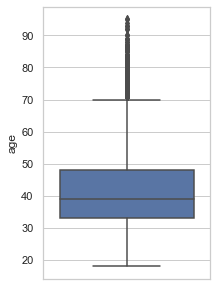

In [20]:
plt.figure(figsize=(3,5))
sns.boxplot(x='age',data=Bank_DF, orient='v');

In [21]:
#Analysis for age
print('The minimum age is 18 and maximum age is 95 so the spread is across')
print('There is a small variance between mean and median values')
print('We do not see any null values')
print('The data for age is right skewed as can be seen from distplot and boxplot above')
print('There are outliers but they seem to be real world situation')

The minimum age is 18 and maximum age is 95 so the spread is across
There is a small variance between mean and median values
We do not see any null values
The data for age is right skewed as can be seen from distplot and boxplot above
There are outliers but they seem to be real world situation


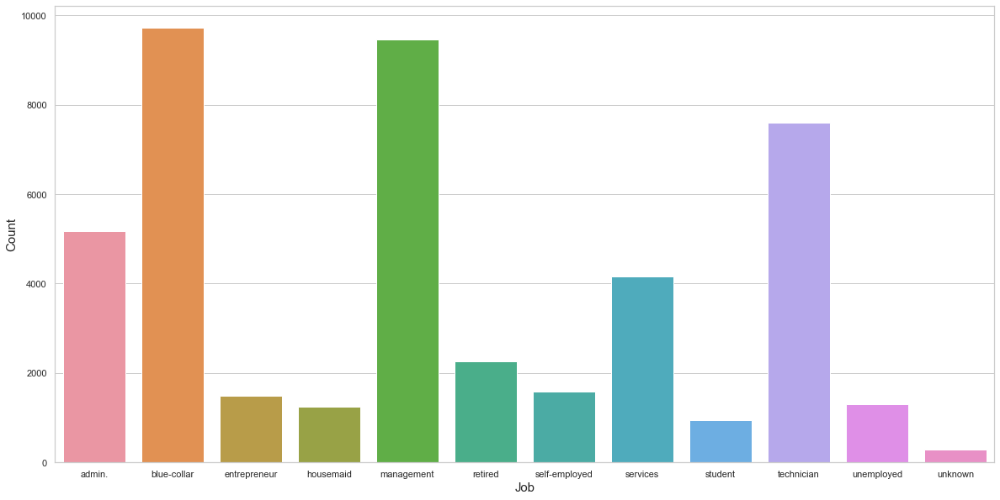

In [22]:
#Job
plt.figure(figsize=(20,10))
sns.countplot(Bank_DF['job'],data=Bank_DF)
plt.xlabel('Job', fontsize=15)
plt.ylabel('Count', fontsize=15)
plt.show();

In [23]:
#Check unique values
Bank_DF['job'].unique() 

['management', 'technician', 'entrepreneur', 'blue-collar', 'unknown', ..., 'services', 'self-employed', 'unemployed', 'housemaid', 'student']
Length: 12
Categories (12, object): ['management', 'technician', 'entrepreneur', 'blue-collar', ..., 'self-employed', 'unemployed', 'housemaid', 'student']

In [24]:
#Check null
Bank_DF['job'].isnull().any()

False

In [25]:
Bank_DF['job'].value_counts()

blue-collar      9732
management       9458
technician       7597
admin.           5171
services         4154
retired          2264
self-employed    1579
entrepreneur     1487
unemployed       1303
housemaid        1240
student           938
unknown           288
Name: job, dtype: int64

In [26]:
#Value counts percentage|
Bank_DF['job'].value_counts(normalize=True)

blue-collar      0.215257
management       0.209197
technician       0.168034
admin.           0.114375
services         0.091880
retired          0.050076
self-employed    0.034925
entrepreneur     0.032890
unemployed       0.028820
housemaid        0.027427
student          0.020747
unknown          0.006370
Name: job, dtype: float64

In [27]:
#Analysis for job

print('For 288 customers the job information is unknown')
print('There are more customers in blue-collar (21.5%) and management (21%) jobs')
print('There are no null values')

For 288 customers the job information is unknown
There are more customers in blue-collar (21.5%) and management (21%) jobs
There are no null values


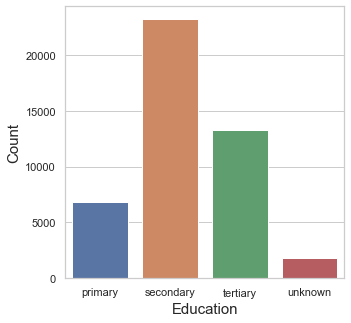

In [28]:
#Education

plt.figure(figsize=(5,5))
sns.countplot(Bank_DF['education'],data=Bank_DF)
plt.xlabel('Education', fontsize=15)
plt.ylabel('Count', fontsize=15)
plt.show();

In [29]:
#Check unique values
Bank_DF['education'].unique() 

['tertiary', 'secondary', 'unknown', 'primary']
Categories (4, object): ['tertiary', 'secondary', 'unknown', 'primary']

In [30]:
#Check null
Bank_DF['education'].isnull().any()

False

In [31]:
#Value counts
Bank_DF['education'].value_counts()

secondary    23202
tertiary     13301
primary       6851
unknown       1857
Name: education, dtype: int64

In [32]:
#Value counts percentage
Bank_DF['education'].value_counts(normalize=True) 

secondary    0.513194
tertiary     0.294198
primary      0.151534
unknown      0.041074
Name: education, dtype: float64

In [33]:
#Analysis for education
print('There are maximum customers with secondary education followed by tertiary')
print('There are 1857 customers for which education details are not available')
print('There are no null values')

There are maximum customers with secondary education followed by tertiary
There are 1857 customers for which education details are not available
There are no null values


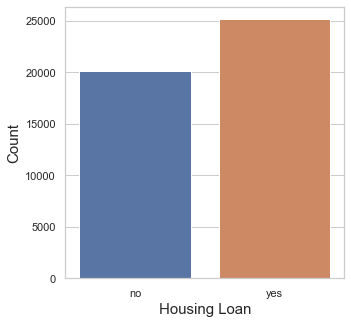

In [34]:
#Housing Loan
plt.figure(figsize=(5,5))
sns.countplot(Bank_DF['housing'],data=Bank_DF)
plt.xlabel('Housing Loan', fontsize=15)
plt.ylabel('Count', fontsize=15)
plt.show();

In [35]:
#Check unique values
Bank_DF['housing'].unique()

['yes', 'no']
Categories (2, object): ['yes', 'no']

In [36]:
#Check null
Bank_DF['housing'].isnull().any() 

False

In [37]:
#Value counts
Bank_DF['housing'].value_counts() 

yes    25130
no     20081
Name: housing, dtype: int64

In [38]:
#Value counts percentage
Bank_DF['housing'].value_counts(normalize=True) 

yes    0.555838
no     0.444162
Name: housing, dtype: float64

In [39]:
#Analysis for housing loan
print('There are more customers who have housing loan')
print('There are no null values')

There are more customers who have housing loan
There are no null values


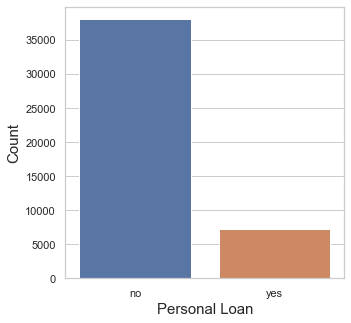

In [40]:
#Personal Loan
plt.figure(figsize=(5,5))
sns.countplot(Bank_DF['loan'],data=Bank_DF)
plt.xlabel('Personal Loan', fontsize=15)
plt.ylabel('Count', fontsize=15)
plt.show();

In [41]:
#Check unique values
Bank_DF['loan'].unique()

['no', 'yes']
Categories (2, object): ['no', 'yes']

In [42]:
#Check null
Bank_DF['loan'].isnull().any() 

False

In [43]:
#Value counts
Bank_DF['loan'].value_counts()

no     37967
yes     7244
Name: loan, dtype: int64

In [44]:
#Value counts percentage
Bank_DF['loan'].value_counts(normalize=True)

no     0.839774
yes    0.160226
Name: loan, dtype: float64

In [45]:
#Analysis for personal loan
print('There are more customers (~84%) who do not have personal loan')
print('There are no null values')

There are more customers (~84%) who do not have personal loan
There are no null values


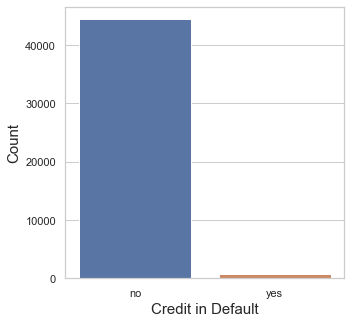

In [46]:
#Credit in default
plt.figure(figsize=(5,5))
sns.countplot(Bank_DF['default'],data=Bank_DF)
plt.xlabel('Credit in Default', fontsize=15)
plt.ylabel('Count', fontsize=15)
plt.show();

In [47]:
#Check unique values
Bank_DF['default'].unique()

['no', 'yes']
Categories (2, object): ['no', 'yes']

In [48]:
#Check null
Bank_DF['default'].isnull().any()

False

In [49]:
#Value counts
Bank_DF['default'].value_counts()

no     44396
yes      815
Name: default, dtype: int64

In [50]:
#Value counts percentage
Bank_DF['default'].value_counts(normalize=True)

no     0.981973
yes    0.018027
Name: default, dtype: float64

In [51]:
#Analysis for credit in default
print('There are only 815 customers with credit in default')
print('Approximately 98% customers do not have credit in default')
print('There are no null values')

There are only 815 customers with credit in default
Approximately 98% customers do not have credit in default
There are no null values


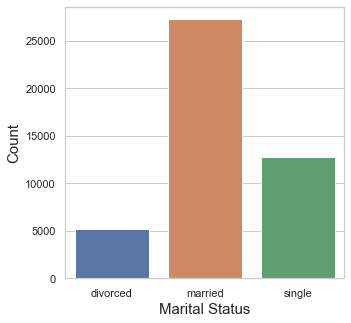

In [52]:
#Marital
plt.figure(figsize=(5,5))
sns.countplot(Bank_DF['marital'],data=Bank_DF)
plt.xlabel('Marital Status', fontsize=15)
plt.ylabel('Count', fontsize=15)
plt.show();

In [53]:
#Check unique values
Bank_DF['marital'].unique()

['married', 'single', 'divorced']
Categories (3, object): ['married', 'single', 'divorced']

In [54]:
#Check null
Bank_DF['marital'].isnull().any()

False

In [55]:
#Value counts
Bank_DF['marital'].value_counts() 

married     27214
single      12790
divorced     5207
Name: marital, dtype: int64

In [56]:
#Value counts percentage
Bank_DF['marital'].value_counts(normalize=True) 

married     0.601933
single      0.282896
divorced    0.115171
Name: marital, dtype: float64

In [57]:
#Analysis for marital
print('There are more married customers followed by singles')
print('There are no null values')

There are more married customers followed by singles
There are no null values


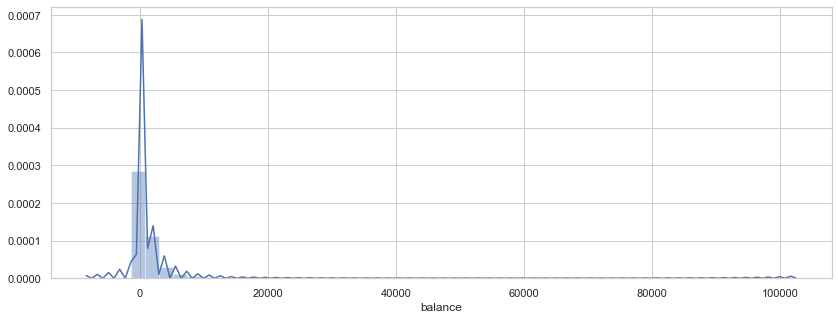

In [58]:
#Balance in account
plt.figure(figsize=(14,5))
sns.distplot(Bank_DF['balance']);

In [59]:
#Check null
Bank_DF['balance'].isnull().any()

False

In [60]:
#Check mean, min, max, std, quartiles
Bank_DF['balance'].describe() 

count     45211.000000
mean       1362.272058
std        3044.765829
min       -8019.000000
25%          72.000000
50%         448.000000
75%        1428.000000
max      102127.000000
Name: balance, dtype: float64

In [61]:
#Median value
Bank_DF['balance'].median()

448.0

In [62]:
print('Min value for balance is -8019')
print('Max value for balance is 102127')
print('Mean for balance is 1362.272058')
print('Median or Q2 for balance is 448.9')
print('Q1 for balance is 72')
print('Q2 for balance is 448')
print('Q3 for balance is 1428')

Min value for balance is -8019
Max value for balance is 102127
Mean for balance is 1362.272058
Median or Q2 for balance is 448.9
Q1 for balance is 72
Q2 for balance is 448
Q3 for balance is 1428


In [63]:
# Q1 and Q3 values from above
outliers_lower=72-1.5*(1428-72)
outliers_upper=1428+1.5*(1428-72)
print(outliers_lower)
print(outliers_upper)

# Number of outliers

#Lower
print('Number of outliers lower:',Bank_DF[Bank_DF['balance']<outliers_lower]['balance'].count()) 

#Upper
print('Number of outliers upper:',Bank_DF[Bank_DF['balance']>outliers_upper]['balance'].count()) 

-1962.0
3462.0
Number of outliers lower: 17
Number of outliers upper: 4712


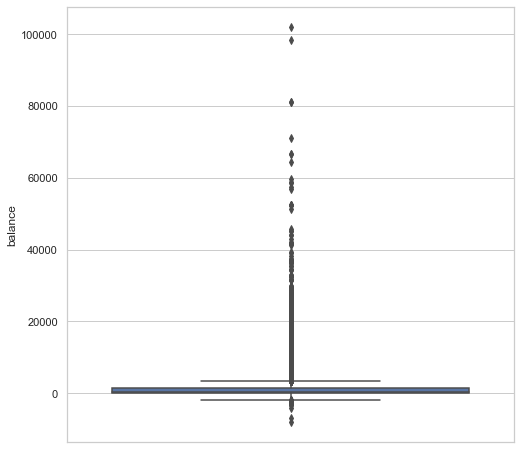

In [64]:
plt.figure(figsize=(8,8))
sns.boxplot(x='balance',data=Bank_DF, orient='v');

In [65]:
#Analysis for Balance
print('The minimum balance is -8019 and maximum balance is 102127')
print('There is high variance between mean and median values')
print('We do not see any null values')
print('The data for balance is highly right skewed as can be seen from distplot and boxplot above')
print('We can see the upper boundary for outliers is 3462 and there are 4712 outliers in upper boundary')

The minimum balance is -8019 and maximum balance is 102127
There is high variance between mean and median values
We do not see any null values
The data for balance is highly right skewed as can be seen from distplot and boxplot above
We can see the upper boundary for outliers is 3462 and there are 4712 outliers in upper boundary


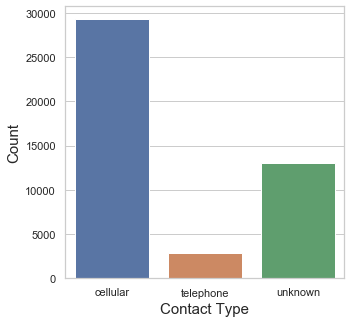

In [66]:
#Contact type
plt.figure(figsize=(5,5))
sns.countplot(Bank_DF['contact'],data=Bank_DF)
plt.xlabel('Contact Type', fontsize=15)
plt.ylabel('Count', fontsize=15)
plt.show();

In [67]:
#Check unique values
Bank_DF['contact'].unique() 

['unknown', 'cellular', 'telephone']
Categories (3, object): ['unknown', 'cellular', 'telephone']

In [68]:
#Check null
Bank_DF['contact'].isnull().any() 

False

In [69]:
#Value counts
Bank_DF['contact'].value_counts() 

cellular     29285
unknown      13020
telephone     2906
Name: contact, dtype: int64

In [70]:
#Value counts percentage
Bank_DF['contact'].value_counts(normalize=True) 

cellular     0.647741
unknown      0.287983
telephone    0.064276
Name: contact, dtype: float64

In [71]:
#Analysis for contact type
print('There are more customers (~65%) who were contacted via mobile')
print('However for 13020 customers the contact type is unknown')
print('There are no null values')

There are more customers (~65%) who were contacted via mobile
However for 13020 customers the contact type is unknown
There are no null values


In [72]:
#Last contact: day
# Check unique values
Bank_DF['day'].unique() 

array([ 5,  6,  7,  8,  9, 12, 13, 14, 15, 16, 19, 20, 21, 23, 26, 27, 28,
       29, 30,  2,  3,  4, 11, 17, 18, 24, 25,  1, 10, 22, 31],
      dtype=int64)

In [73]:
# Check null
Bank_DF['day'].isnull().any() 

False

In [74]:
# value counts
Bank_DF['day'].value_counts() 

20    2752
18    2308
21    2026
17    1939
6     1932
5     1910
14    1848
8     1842
28    1830
7     1817
19    1757
29    1745
15    1703
12    1603
13    1585
30    1566
9     1561
11    1479
4     1445
16    1415
2     1293
27    1121
3     1079
26    1035
23     939
22     905
25     840
31     643
10     524
24     447
1      322
Name: day, dtype: int64

In [75]:
# value counts
Bank_DF['day'].value_counts(normalize=True) 

20    0.060870
18    0.051050
21    0.044812
17    0.042888
6     0.042733
5     0.042246
14    0.040875
8     0.040742
28    0.040477
7     0.040189
19    0.038862
29    0.038597
15    0.037668
12    0.035456
13    0.035058
30    0.034638
9     0.034527
11    0.032713
4     0.031961
16    0.031298
2     0.028599
27    0.024795
3     0.023866
26    0.022893
23    0.020769
22    0.020017
25    0.018580
31    0.014222
10    0.011590
24    0.009887
1     0.007122
Name: day, dtype: float64

In [76]:
#Last contact: month
#Check unique values
Bank_DF['month'].unique() 

['may', 'jun', 'jul', 'aug', 'oct', ..., 'jan', 'feb', 'mar', 'apr', 'sep']
Length: 12
Categories (12, object): ['may', 'jun', 'jul', 'aug', ..., 'feb', 'mar', 'apr', 'sep']

In [77]:
#Check null
Bank_DF['month'].isnull().any() 

False

In [78]:
#Value counts
Bank_DF['month'].value_counts() 

may    13766
jul     6895
aug     6247
jun     5341
nov     3970
apr     2932
feb     2649
jan     1403
oct      738
sep      579
mar      477
dec      214
Name: month, dtype: int64

In [79]:
#Value counts percentage
Bank_DF['month'].value_counts(normalize=True)

may    0.304483
jul    0.152507
aug    0.138174
jun    0.118135
nov    0.087810
apr    0.064851
feb    0.058592
jan    0.031032
oct    0.016323
sep    0.012807
mar    0.010551
dec    0.004733
Name: month, dtype: float64

In [80]:
#Analysis for contact month
print('Max contacts were made in the month of May and max contacts ranges from May to August')
print('There are no null values')

Max contacts were made in the month of May and max contacts ranges from May to August
There are no null values


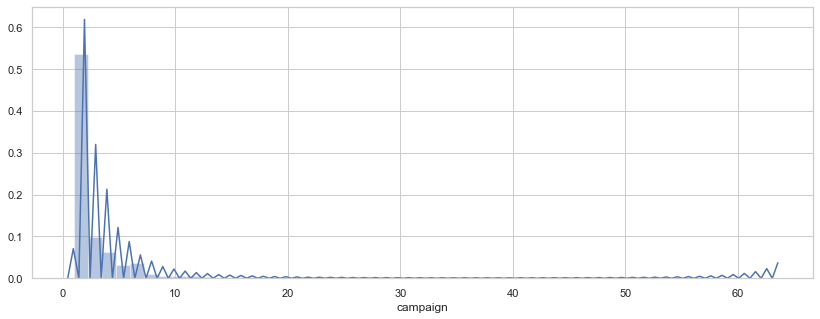

In [81]:
#Campaign
plt.figure(figsize=(14,5))
sns.distplot(Bank_DF['campaign']);

In [82]:
#Check null
Bank_DF['campaign'].isnull().any() 

False

In [83]:
#Check mean, min, max, std, quartiles
Bank_DF['campaign'].describe()


count    45211.000000
mean         2.763841
std          3.098021
min          1.000000
25%          1.000000
50%          2.000000
75%          3.000000
max         63.000000
Name: campaign, dtype: float64

In [84]:
#Median value
Bank_DF['campaign'].median() 

2.0

In [85]:
print('Mean for campaign is 2.763841')
print('Median or Q2 for campaign is 2')
print('Min value for campaign is 1')
print('Max value for campaign is 63')
print('Q1 for campaign is 1')
print('Q2 for campaign is 2')
print('Q3 for campaign is 3')
print('In the plot we saw the data is right skewed')

Mean for campaign is 2.763841
Median or Q2 for campaign is 2
Min value for campaign is 1
Max value for campaign is 63
Q1 for campaign is 1
Q2 for campaign is 2
Q3 for campaign is 3
In the plot we saw the data is right skewed


In [86]:
# Q1 and Q3 values from above
outliers_lower=1-1.5*(3-1)
outliers_upper=3+1.5*(3-1)
print(outliers_lower)
print(outliers_upper)

# Number of outliers

#Lower
print('Number of outliers lower:',Bank_DF[Bank_DF['balance']<outliers_lower]['balance'].count()) 

#Upper
print('Number of outliers upper:',Bank_DF[Bank_DF['balance']>outliers_upper]['balance'].count()) 

-2.0
6.0
Number of outliers lower: 3691
Number of outliers upper: 37106


In [87]:
#Analysis Campaign
print('There is not much difference between mean and median values')
print('Minimum and Maximum for campaign are 1 and 63')
print('Data is highly right skewed')

There is not much difference between mean and median values
Minimum and Maximum for campaign are 1 and 63
Data is highly right skewed


In [88]:
#pdays: Days since last contact
#Check null
Bank_DF['pdays'].isnull().any()

False

In [89]:
#Check mean, min, max, std, quartiles
Bank_DF['pdays'].describe()

count    45211.000000
mean        40.197828
std        100.128746
min         -1.000000
25%         -1.000000
50%         -1.000000
75%         -1.000000
max        871.000000
Name: pdays, dtype: float64

In [90]:
#Median value
Bank_DF['pdays'].median()

-1.0

In [91]:
print('pdays is -1: {}'.format(Bank_DF[Bank_DF.pdays==-1].shape[0]))
print ('Most of records for pdays value are -1 which means that customer has never been contacted')

pdays is -1: 36954
Most of records for pdays value are -1 which means that customer has never been contacted


In [92]:
#Number of contacts performed
#Check null
Bank_DF['previous'].isnull().any()

False

In [93]:
#Check mean, min, max, std, quartiles
Bank_DF['previous'].describe()


count    45211.000000
mean         0.580323
std          2.303441
min          0.000000
25%          0.000000
50%          0.000000
75%          0.000000
max        275.000000
Name: previous, dtype: float64

In [94]:
#Median value
Bank_DF['previous'].median() 

0.0

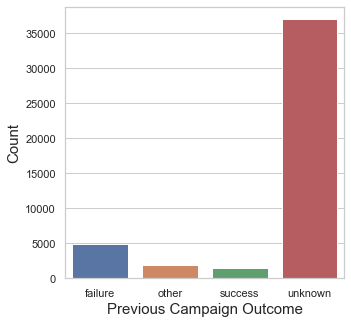

In [95]:
#Previous Campaign
plt.figure(figsize=(5,5))
sns.countplot(Bank_DF['poutcome'],data=Bank_DF)
plt.xlabel('Previous Campaign Outcome', fontsize=15)
plt.ylabel('Count', fontsize=15)
plt.show();

In [96]:
#Check unique values
Bank_DF['poutcome'].unique() 

['unknown', 'failure', 'other', 'success']
Categories (4, object): ['unknown', 'failure', 'other', 'success']

In [97]:
#Check null
Bank_DF['poutcome'].isnull().any() 

False

In [98]:
#Value counts
Bank_DF['poutcome'].value_counts() 

unknown    36959
failure     4901
other       1840
success     1511
Name: poutcome, dtype: int64

In [99]:
#Value counts percentage
Bank_DF['poutcome'].value_counts(normalize=True) 

unknown    0.817478
failure    0.108403
other      0.040698
success    0.033421
Name: poutcome, dtype: float64

In [100]:
print ('The success rate from previous campaign was around 3% and for a majority of customers it is unknown (81.7%)')

The success rate from previous campaign was around 3% and for a majority of customers it is unknown (81.7%)


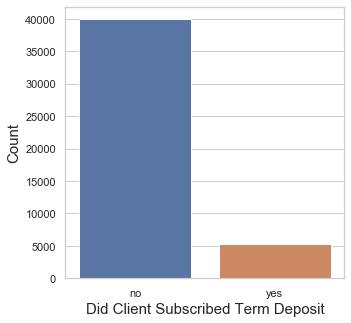

In [101]:
#Target

plt.figure(figsize=(5,5))
sns.countplot(Bank_DF['Target'],data=Bank_DF)
plt.xlabel('Did Client Subscribed Term Deposit', fontsize=15)
plt.ylabel('Count', fontsize=15)
plt.show();

In [102]:
#Check unique values
Bank_DF['Target'].unique() 

['no', 'yes']
Categories (2, object): ['no', 'yes']

In [103]:
#Check null
Bank_DF['Target'].isnull().any() 

False

In [104]:
#Value counts
Bank_DF['Target'].value_counts() 


no     39922
yes     5289
Name: Target, dtype: int64

In [105]:
#Value counts percentage
Bank_DF['Target'].value_counts(normalize=True)

no     0.883015
yes    0.116985
Name: Target, dtype: float64

In [106]:
print('Around 12% customers subscribed to term deposits')

Around 12% customers subscribed to term deposits


In [107]:
#Data challenges


#We have seen unknown/mising data for job and education which can impact our target variables
# Let's check job
Bank_DF['job'].value_counts()

blue-collar      9732
management       9458
technician       7597
admin.           5171
services         4154
retired          2264
self-employed    1579
entrepreneur     1487
unemployed       1303
housemaid        1240
student           938
unknown           288
Name: job, dtype: int64

In [108]:
#We see for 288 customers we do not have their job information
#The number of customers who are above 60
Bank_DF['job'][Bank_DF['age']>60][Bank_DF['job']=='unknown'].value_counts()

unknown          22
unemployed        0
technician        0
student           0
services          0
self-employed     0
retired           0
management        0
housemaid         0
entrepreneur      0
blue-collar       0
admin.            0
Name: job, dtype: int64

In [109]:
#22 customers have no job information and are above 60 Therefore we can move them to retired category
Bank_DF.loc[(Bank_DF['age']>60) & (Bank_DF['job']=='unknown'), 'job'] = 'retired'

In [110]:
#Comparing job with education to check if there a corerelation
pd.crosstab(Bank_DF['job'], Bank_DF['education'])

education,primary,secondary,tertiary,unknown
job,,,,
admin.,209,4219,572,171
blue-collar,3758,5371,149,454
entrepreneur,183,542,686,76
housemaid,627,395,173,45
management,294,1121,7801,242
retired,796,989,371,130
self-employed,130,577,833,39
services,345,3457,202,150
student,44,508,223,163


In [111]:
#In case a person has primary education only then mostly they have blue-collar jobs
#We can also see a person with tertiary education mostly have management jobs
#We are unable to determine undertstanding for people with secondary education as the spread is across technician, blue-collar and admin jobs
#Moving customers with primary education and unknown job to blue-collar job and customers with tertiary education and unknown job to management job

Bank_DF.loc[(Bank_DF['education']=='primary') & (Bank_DF['job']=='unknown'), 'job'] = 'blue-collar'
Bank_DF.loc[(Bank_DF['education']=='tertiary') & (Bank_DF['job']=='unknown'), 'job'] = 'management'
Bank_DF

,age,job,marital,education,default,balance,housing,loan,contact,day,month,duration,campaign,pdays,previous,poutcome,Target
0,58,management,married,tertiary,no,2143,yes,no,unknown,5,may,261,1,-1,0,unknown,no
1,44,technician,single,secondary,no,29,yes,no,unknown,5,may,151,1,-1,0,unknown,no
2,33,entrepreneur,married,secondary,no,2,yes,yes,unknown,5,may,76,1,-1,0,unknown,no
3,47,blue-collar,married,unknown,no,1506,yes,no,unknown,5,may,92,1,-1,0,unknown,no
4,33,unknown,single,unknown,no,1,no,no,unknown,5,may,198,1,-1,0,unknown,no
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
45206,51,technician,married,tertiary,no,825,no,no,cellular,17,nov,977,3,-1,0,unknown,yes
45207,71,retired,divorced,primary,no,1729,no,no,cellular,17,nov,456,2,-1,0,unknown,yes
45208,72,retired,married,secondary,no,5715,no,no,cellular,17,nov,1127,5,184,3,success,yes
45209,57,blue-collar,married,secondary,no,668,no,no,telephone,17,nov,508,4,-1,0,unknown,no


In [112]:
pd.crosstab(Bank_DF['education'], Bank_DF['job'])

job,admin.,blue-collar,entrepreneur,housemaid,management,retired,self-employed,services,student,technician,unemployed,unknown
education,,,,,,,,,,,,
primary,209,3808,183,627,294,796,130,345,44,158,257,0
secondary,4219,5371,542,395,1121,989,577,3457,508,5229,728,66
tertiary,572,149,686,173,7835,371,833,202,223,1968,289,0
unknown,171,454,76,45,242,130,39,150,163,242,29,116


In [113]:
#We can conclude below understanding
#People in admin job mostly have secondary education
#People in management job mostly have tertiary education
#People in services job mostly have secondary education
#People in technician job mostly have secondary education
#People in housemaid job mostly have primary education

Bank_DF.loc[(Bank_DF['job']=='admin.') & (Bank_DF['education']=='unknown'), 'education'] = 'secondary'
Bank_DF.loc[(Bank_DF['job']=='management') & (Bank_DF['education']=='unknown'), 'education'] = 'tertiary'
Bank_DF.loc[(Bank_DF['job']=='services') & (Bank_DF['education']=='unknown'), 'education'] = 'secondary'
Bank_DF.loc[(Bank_DF['job']=='technician') & (Bank_DF['education']=='unknown'), 'education'] = 'secondary'
Bank_DF.loc[(Bank_DF['job']=='housemaid') & (Bank_DF['education']=='unknown'), 'education'] ='primary'
Bank_DF

,age,job,marital,education,default,balance,housing,loan,contact,day,month,duration,campaign,pdays,previous,poutcome,Target
0,58,management,married,tertiary,no,2143,yes,no,unknown,5,may,261,1,-1,0,unknown,no
1,44,technician,single,secondary,no,29,yes,no,unknown,5,may,151,1,-1,0,unknown,no
2,33,entrepreneur,married,secondary,no,2,yes,yes,unknown,5,may,76,1,-1,0,unknown,no
3,47,blue-collar,married,unknown,no,1506,yes,no,unknown,5,may,92,1,-1,0,unknown,no
4,33,unknown,single,unknown,no,1,no,no,unknown,5,may,198,1,-1,0,unknown,no
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
45206,51,technician,married,tertiary,no,825,no,no,cellular,17,nov,977,3,-1,0,unknown,yes
45207,71,retired,divorced,primary,no,1729,no,no,cellular,17,nov,456,2,-1,0,unknown,yes
45208,72,retired,married,secondary,no,5715,no,no,cellular,17,nov,1127,5,184,3,success,yes
45209,57,blue-collar,married,secondary,no,668,no,no,telephone,17,nov,508,4,-1,0,unknown,no


In [114]:
# We can combine admin into management, housemaid into blue-collar and self employed with entrepreneur

Job_mapping = {'admin.':'management', 'housemaid':'blue-collar', 'self-employed':'entrepreneur'}
Bank_DF['job'] = Bank_DF['job'].replace(Job_mapping)
Bank_DF['job'].value_counts()
Bank_DF['job'].value_counts(normalize=True) 
Bank_DF['job']=Bank_DF['job'].astype('category')
Bank_DF

,age,job,marital,education,default,balance,housing,loan,contact,day,month,duration,campaign,pdays,previous,poutcome,Target
0,58,management,married,tertiary,no,2143,yes,no,unknown,5,may,261,1,-1,0,unknown,no
1,44,technician,single,secondary,no,29,yes,no,unknown,5,may,151,1,-1,0,unknown,no
2,33,entrepreneur,married,secondary,no,2,yes,yes,unknown,5,may,76,1,-1,0,unknown,no
3,47,blue-collar,married,unknown,no,1506,yes,no,unknown,5,may,92,1,-1,0,unknown,no
4,33,unknown,single,unknown,no,1,no,no,unknown,5,may,198,1,-1,0,unknown,no
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
45206,51,technician,married,tertiary,no,825,no,no,cellular,17,nov,977,3,-1,0,unknown,yes
45207,71,retired,divorced,primary,no,1729,no,no,cellular,17,nov,456,2,-1,0,unknown,yes
45208,72,retired,married,secondary,no,5715,no,no,cellular,17,nov,1127,5,184,3,success,yes
45209,57,blue-collar,married,secondary,no,668,no,no,telephone,17,nov,508,4,-1,0,unknown,no


In [115]:
#pdays had -1 for a many records, meaning the customer has never been contacted
pd.crosstab(Bank_DF['pdays'],Bank_DF['poutcome'])
Bank_DF

,age,job,marital,education,default,balance,housing,loan,contact,day,month,duration,campaign,pdays,previous,poutcome,Target
0,58,management,married,tertiary,no,2143,yes,no,unknown,5,may,261,1,-1,0,unknown,no
1,44,technician,single,secondary,no,29,yes,no,unknown,5,may,151,1,-1,0,unknown,no
2,33,entrepreneur,married,secondary,no,2,yes,yes,unknown,5,may,76,1,-1,0,unknown,no
3,47,blue-collar,married,unknown,no,1506,yes,no,unknown,5,may,92,1,-1,0,unknown,no
4,33,unknown,single,unknown,no,1,no,no,unknown,5,may,198,1,-1,0,unknown,no
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
45206,51,technician,married,tertiary,no,825,no,no,cellular,17,nov,977,3,-1,0,unknown,yes
45207,71,retired,divorced,primary,no,1729,no,no,cellular,17,nov,456,2,-1,0,unknown,yes
45208,72,retired,married,secondary,no,5715,no,no,cellular,17,nov,1127,5,184,3,success,yes
45209,57,blue-collar,married,secondary,no,668,no,no,telephone,17,nov,508,4,-1,0,unknown,no


In [116]:
#Outliers
print('The minimum balance is -8019 and maximum balance is 102127')
print('There is much variance between mean and median values and we do not see any null values')
print('The data for balance is highly right skewed')
print('Number of outliers upper: 4712')
print('Upper boundary for outliers: 3462')

The minimum balance is -8019 and maximum balance is 102127
There is much variance between mean and median values and we do not see any null values
The data for balance is highly right skewed
Number of outliers upper: 4712
Upper boundary for outliers: 3462


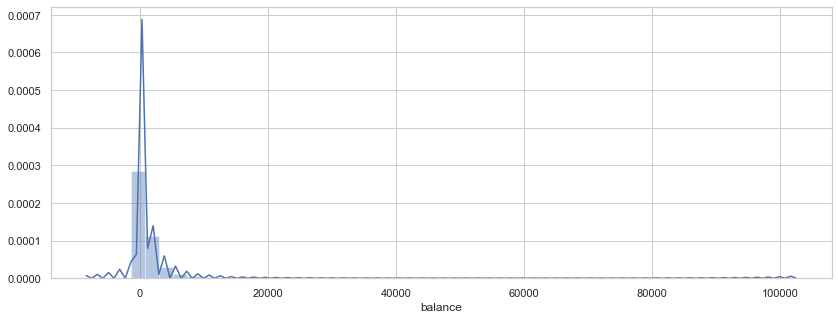

In [117]:
plt.figure(figsize=(14,5))
sns.distplot(Bank_DF['balance']);

In [118]:
print ('Negative balances in the dataset, we can update them as zero balance as customers with higher balance only will choose for term deposits. Converting negative balances to zero.')
Bank_DF.loc[Bank_DF.balance<0,'balance'] = 0
Bank_DF.loc[Bank_DF.balance>3462,'balance'] = 3462

Negative balances in the dataset, we can update them as zero balance as customers with higher balance only will choose for term deposits. Converting negative balances to zero.


<Figure size 1440x360 with 0 Axes>

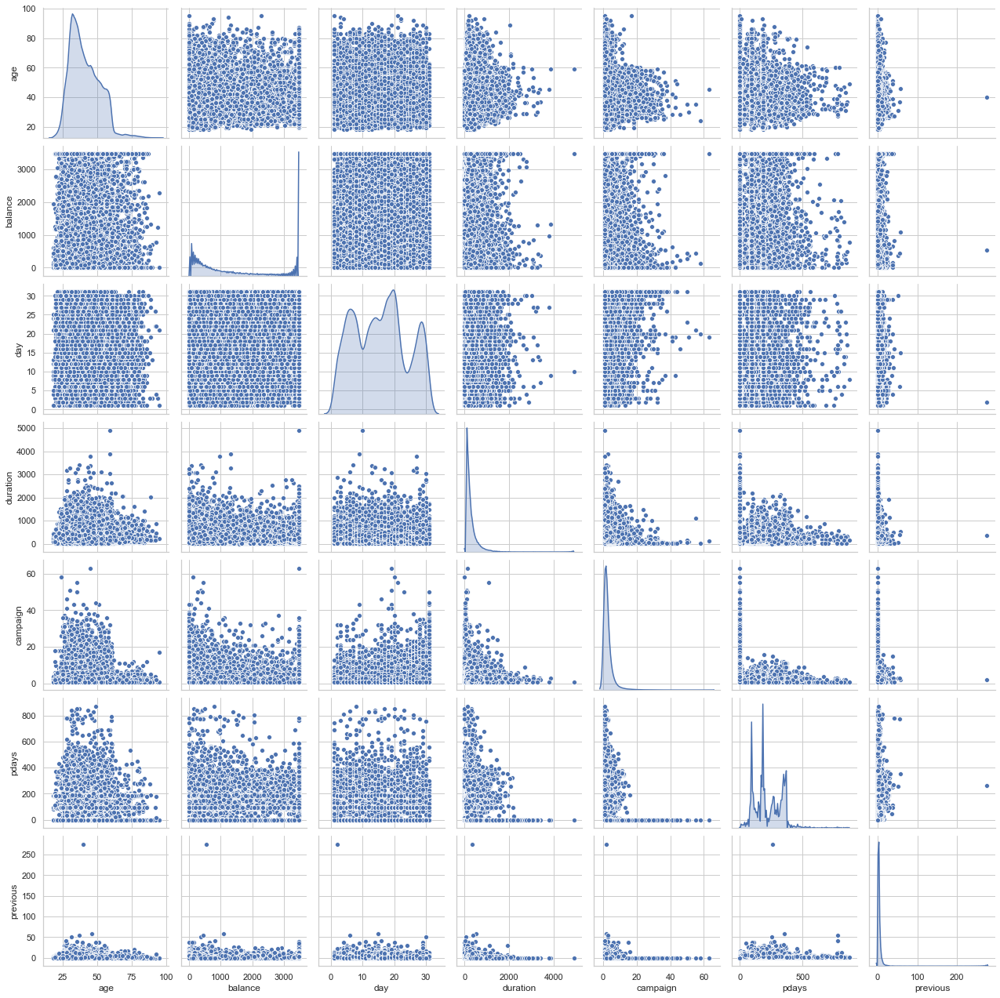

In [119]:
#Multivariate analysis
plt.figure(figsize=(20,5))
sns.pairplot(Bank_DF, diag_kind='kde', diag_kws={'bw':'1.0'})
plt.show();

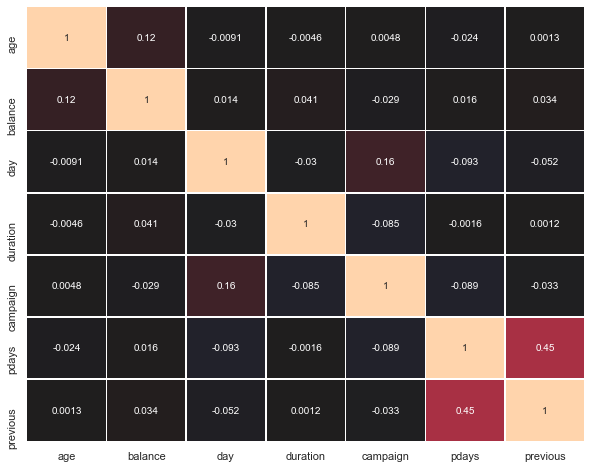

In [120]:
plt.figure(figsize=(10,8))
sns.heatmap(Bank_DF.corr(),
annot=True,
linewidths=.5,
center=0,
cbar=False)
plt.show();

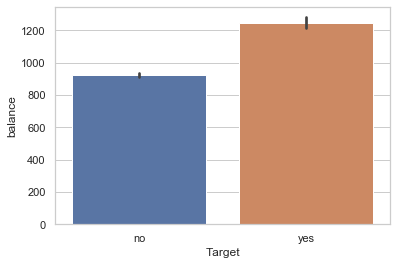

customers with higher balance have more term deposits


In [121]:
# Target and Balance
sns.barplot(x='Target', y='balance', data=Bank_DF)
plt.show();
print('customers with higher balance have more term deposits')

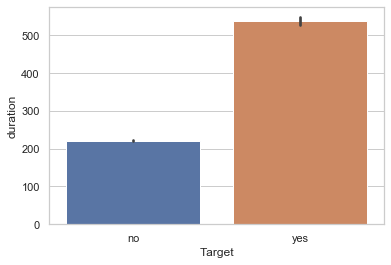

In [122]:
#Target and duration
sns.barplot(x='Target', y='duration', data=Bank_DF)
plt.show();

In [123]:
#If call is longer more customers have subscribed
#Dropping duration as it's value will be known after call and doesn't seem impact target variable
Bank_DF=Bank_DF.drop(['duration'],axis=1)

In [124]:
#Target and job
pd.crosstab(Bank_DF['job'], Bank_DF['Target'], normalize='index')

Target,no,yes
job,,
blue-collar,0.925603,0.074397
entrepreneur,0.898891,0.101109
management,0.867967,0.132033
retired,0.772966,0.227034
services,0.911170,0.088830
student,0.713220,0.286780
technician,0.889430,0.110570
unemployed,0.844973,0.155027
unknown,0.868132,0.131868


The highest percentages for customers accepting term deposit are:
#Student subscribed to term deposit = 28.67%
#Retired subscribed to term deposit = 22.79%
#Unempld subscribed to term deposit = 15.50%
#People with job management have more term deposits followed by technician and blue-collar


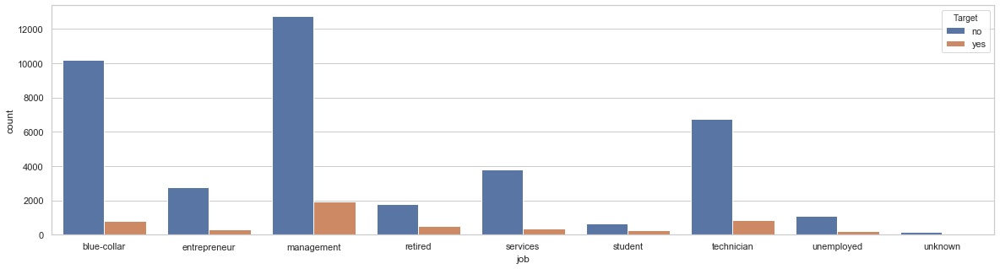

In [125]:
plt.figure(figsize=(20,5))
sns.countplot(x='job',hue='Target', data=Bank_DF);

print('The highest percentages for customers accepting term deposit are:')
print('#Student subscribed to term deposit = 28.67%')
print('#Retired subscribed to term deposit = 22.79%')
print('#Unempld subscribed to term deposit = 15.50%')
print('#People with job management have more term deposits followed by technician and blue-collar')

In [126]:
#Target and marital
pd.crosstab(Bank_DF['marital'], Bank_DF['Target'], normalize='index')

Target,no,yes
marital,,
divorced,0.880545,0.119455
married,0.898765,0.101235
single,0.850508,0.149492


The highest percentages for customers accepting term deposit are:
Single subscribed to term deposit = 14.94%
Divorced subscribed to term deposit = 11.94%
Overall married customers have more term deposits followed by single customers


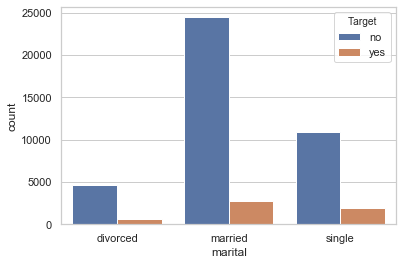

In [127]:
sns.countplot(x='marital',hue='Target', data=Bank_DF);

print('The highest percentages for customers accepting term deposit are:')
print('Single subscribed to term deposit = 14.94%')
print('Divorced subscribed to term deposit = 11.94%')
print('Overall married customers have more term deposits followed by single customers')

In [128]:
#Target and Education
pd.crosstab(Bank_DF['education'], Bank_DF['Target'], normalize='index')

Target,no,yes
education,,
primary,0.913718,0.086282
secondary,0.894382,0.105618
tertiary,0.849073,0.150927
unknown,0.860973,0.139027


The highest percentages for customers accepting term deposit are:
Customers with Tertiary(higher) education subscribed to term deposit = 15%
Next highest percentage is for customers for whom we do not know their education = 13.57%
Overall customers with secondary education have more term deposits followed by tertiary education


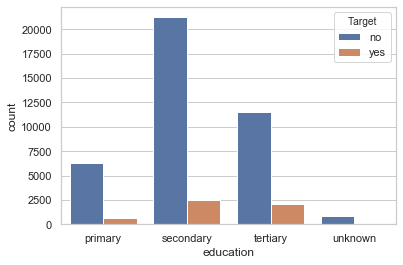

In [129]:
sns.countplot(x='education',hue='Target', data=Bank_DF);

print('The highest percentages for customers accepting term deposit are:')
print('Customers with Tertiary(higher) education subscribed to term deposit = 15%')
print('Next highest percentage is for customers for whom we do not know their education = 13.57%')
print('Overall customers with secondary education have more term deposits followed by tertiary education')

In [130]:
#Target and default
pd.crosstab(Bank_DF['default'], Bank_DF['Target'], normalize='index')

Target,no,yes
default,,
no,0.882039,0.117961
yes,0.936196,0.063804


The customers who do not default on credit have a higher percentage of accepting term deposit


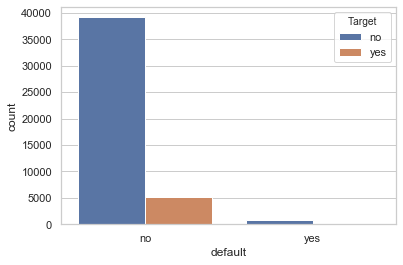

In [131]:
sns.countplot(x='default',hue='Target', data=Bank_DF);
print('The customers who do not default on credit have a higher percentage of accepting term deposit')

In [132]:
#Target and Housing
pd.crosstab(Bank_DF['housing'], Bank_DF['Target'], normalize='index')

Target,no,yes
housing,,
no,0.832976,0.167024
yes,0.923000,0.077000


The customers who do not have home loan had higher %age accepting term deposits


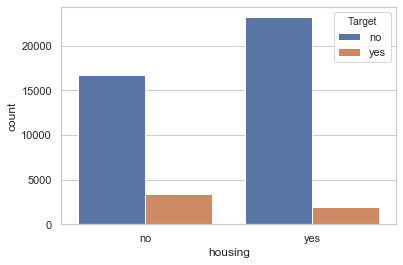

In [133]:
sns.countplot(x='housing',hue='Target', data=Bank_DF);
print('The customers who do not have home loan had higher %age accepting term deposits')

In [134]:
#Target and Personal Loan
pd.crosstab(Bank_DF['loan'], Bank_DF['Target'], normalize='index')

Target,no,yes
loan,,
no,0.873443,0.126557
yes,0.933186,0.066814


The customers who do not have personal loan had higher ppercentage accepting term deposit


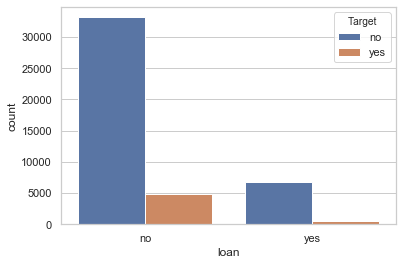

In [135]:
sns.countplot(x='loan',hue='Target', data=Bank_DF);
print('The customers who do not have personal loan had higher ppercentage accepting term deposit')

In [136]:
#Target and Contact
pd.crosstab(Bank_DF['contact'], Bank_DF['Target'])

Target,no,yes
contact,,
cellular,24916,4369
telephone,2516,390
unknown,12490,530


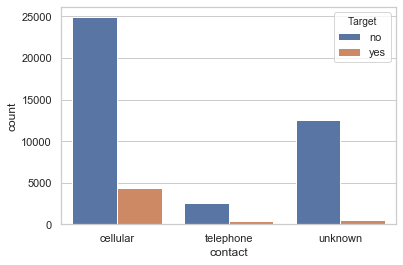

In [137]:
sns.countplot(x='contact',hue='Target', data=Bank_DF);

In [138]:
print('There are 13020 records where contact is Unkown.') 
print('From that count 530 have Target variable as yes.')
print('The majority where the Target variable is yes when the contact type was cellular.')

There are 13020 records where contact is Unkown.
From that count 530 have Target variable as yes.
The majority where the Target variable is yes when the contact type was cellular.


In [139]:
#We can move unknown contacts where Target is yes to contact as cellular
Bank_DF.loc[(Bank_DF['contact']=='unknown') & (Bank_DF['Target']=='yes'), 'contact'] = 'cellular'
Bank_DF

,age,job,marital,education,default,balance,housing,loan,contact,day,month,campaign,pdays,previous,poutcome,Target
0,58,management,married,tertiary,no,2143,yes,no,unknown,5,may,1,-1,0,unknown,no
1,44,technician,single,secondary,no,29,yes,no,unknown,5,may,1,-1,0,unknown,no
2,33,entrepreneur,married,secondary,no,2,yes,yes,unknown,5,may,1,-1,0,unknown,no
3,47,blue-collar,married,unknown,no,1506,yes,no,unknown,5,may,1,-1,0,unknown,no
4,33,unknown,single,unknown,no,1,no,no,unknown,5,may,1,-1,0,unknown,no
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
45206,51,technician,married,tertiary,no,825,no,no,cellular,17,nov,3,-1,0,unknown,yes
45207,71,retired,divorced,primary,no,1729,no,no,cellular,17,nov,2,-1,0,unknown,yes
45208,72,retired,married,secondary,no,3462,no,no,cellular,17,nov,5,184,3,success,yes
45209,57,blue-collar,married,secondary,no,668,no,no,telephone,17,nov,4,-1,0,unknown,no


In [140]:
#Encode categorical variables

labelEncod = preprocessing.LabelEncoder()
Bank_DF.job = labelEncod.fit_transform(Bank_DF.job)
Bank_DF.marital = labelEncod.fit_transform(Bank_DF.marital)
Bank_DF.education = labelEncod.fit_transform(Bank_DF.education)
Bank_DF.default = labelEncod.fit_transform(Bank_DF.default)
Bank_DF.housing = labelEncod.fit_transform(Bank_DF.housing)
Bank_DF.loan = labelEncod.fit_transform(Bank_DF.loan)
Bank_DF.contact = labelEncod.fit_transform(Bank_DF.contact)
Bank_DF.month = labelEncod.fit_transform(Bank_DF.month)
Bank_DF.poutcome = labelEncod.fit_transform(Bank_DF.poutcome)
Bank_DF.Target = labelEncod.fit_transform(Bank_DF.Target)
Bank_DF.describe().T

,count,mean,std,min,25%,50%,75%,max
age,45211.0,40.936210,10.618762,18.0,33.0,39.0,48.0,95.0
job,45211.0,2.581562,2.205370,0.0,1.0,2.0,4.0,8.0
marital,45211.0,1.167725,0.608230,0.0,1.0,1.0,2.0,2.0
education,45211.0,1.191568,0.710272,0.0,1.0,1.0,2.0,3.0
default,45211.0,0.018027,0.133049,0.0,0.0,0.0,0.0,1.0
balance,45211.0,959.726704,1148.515651,0.0,72.0,448.0,1428.0,3462.0
housing,45211.0,0.555838,0.496878,0.0,0.0,1.0,1.0,1.0
loan,45211.0,0.160226,0.366820,0.0,0.0,0.0,0.0,1.0
contact,45211.0,0.616797,0.888198,0.0,0.0,0.0,2.0,2.0
day,45211.0,15.806419,8.322476,1.0,8.0,16.0,21.0,31.0


In [141]:
#Deliverable – 2 (Prepare the data for analytics) – (10)
#Handle target variable inbalance

Bank_DF['Target'].value_counts(normalize=True)
Bank_DF_copy=Bank_DF.copy()
Bank_DF_copy_2=Bank_DF_copy[Bank_DF.Target==1]
Bank_DF_copy=pd.concat([Bank_DF_copy, Bank_DF_copy_2])
Bank_DF_copy=pd.concat([Bank_DF_copy, Bank_DF_copy_2])
Bank_DF_copy=pd.concat([Bank_DF_copy, Bank_DF_copy_2])
Bank_DF_copy=pd.concat([Bank_DF_copy, Bank_DF_copy_2])
Bank_DF_copy=pd.concat([Bank_DF_copy, Bank_DF_copy_2])
Bank_DF_copy=pd.concat([Bank_DF_copy, Bank_DF_copy_2])
Bank_DF_copy=pd.concat([Bank_DF_copy, Bank_DF_copy_2])
Bank_DF=Bank_DF_copy
Bank_DF
Bank_DF['Target'].value_counts(normalize=True)

1    0.514532
0    0.485468
Name: Target, dtype: float64

In [142]:
#Get the data model ready.

#Independent variables
x=Bank_DF.drop('Target',axis=1) 

#Dependent variable
y=Bank_DF['Target'] 
features = [col for col in Bank_DF.columns if col != 'Target']

In [143]:
#Create the training set and test set in ratio of 70:30
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.30,random_state=1)

In [144]:
#Normalize/Scale
from sklearn.preprocessing import StandardScaler
scaler=StandardScaler()
scaler.fit(x_train)
x_train = scaler.transform(x_train)
x_test = scaler.transform(x_test)

In [145]:
StandardScaler(copy=True, with_mean=True, with_std=True)

StandardScaler(copy=True, with_mean=True, with_std=True)

In [146]:
#Deliverable – 3 (create the ensemble model) – (30)

#First create models using Logistic Regression and Decision Tree algorithm. Note the model performance by using 
#different matrices. Use confusion matrix to evaluate
#class level metrics i.e. Precision/Recall. Also reflect the accuracy and F1 score of the model. (10 marks)

#Logistic Regression

logreg = LogisticRegression(random_state=1)
logreg.fit(x_train, y_train)

LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=100,
                   multi_class='auto', n_jobs=None, penalty='l2',
                   random_state=1, solver='lbfgs', tol=0.0001, verbose=0,
                   warm_start=False)

In [147]:
#Train data
print("Train: %.2f" % logreg.score(x_train, y_train)) 
#Test data
print("Test: %.2f" % logreg.score(x_test, y_test)) 

Train: 0.68
Test: 0.68


In [148]:
#predict
y_predict = logreg.predict(x_test)

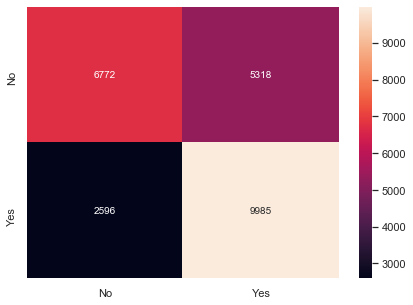

In [149]:
#Confusion matrix
cm=metrics.confusion_matrix(y_test, y_predict, labels=[0, 1])
df_cm = pd.DataFrame(cm, index = [i for i in ["No","Yes"]],
                  columns = [i for i in ["No","Yes"]])
plt.figure(figsize = (7,5))
sns.heatmap(df_cm, annot=True ,fmt='g')

In [150]:
# Check different metrics
print('Confusion Matrix')
print(confusion_matrix(y_test,y_predict))

var_recall=recall_score(y_test,y_predict)
print("Recall:",var_recall)

var_precision=precision_score(y_test,y_predict)
print("Precision:",var_precision)

var_f1=f1_score(y_test,y_predict)
print("F1 Score:",var_f1)

var_roc=roc_auc_score(y_test,y_predict)
print("Roc Auc Score:",var_roc)

var_accuracy=accuracy_score(y_test,y_predict)
print("Accuracy Score:",var_accuracy)

print(classification_report(y_test, y_predict))

Confusion Matrix
[[6772 5318]
 [2596 9985]]
Recall: 0.7936571019791749
Precision: 0.6524864405672091
F1 Score: 0.7161813226222924
Roc Auc Score: 0.6768947213783385
Accuracy Score: 0.6792185156661668
              precision    recall  f1-score   support

           0       0.72      0.56      0.63     12090
           1       0.65      0.79      0.72     12581

    accuracy                           0.68     24671
   macro avg       0.69      0.68      0.67     24671
weighted avg       0.69      0.68      0.67     24671



In [151]:
#Result dataframe for final comparison
resultsDf = pd.DataFrame({'Method':['Logistic Regression'], 'Accuracy': var_accuracy, 
                          'Recall': var_recall,'Precision': var_precision,'F1 Score': var_f1,'ROC AUC Score': var_roc})
resultsDf = resultsDf[['Method', 'Accuracy','Recall','Precision','F1 Score','ROC AUC Score']]
resultsDf

,Method,Accuracy,Recall,Precision,F1 Score,ROC AUC Score
0,Logistic Regression,0.679219,0.793657,0.652486,0.716181,0.676895


In [152]:
#Decision Tree
dt_Tree = DecisionTreeClassifier(criterion = 'entropy',random_state=1 )
dt_Tree.fit(x_train, y_train)

DecisionTreeClassifier(ccp_alpha=0.0, class_weight=None, criterion='entropy',
                       max_depth=None, max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, presort='deprecated',
                       random_state=1, splitter='best')

In [153]:
#Train data
print("Train: %.2f" % dt_Tree.score(x_train, y_train)) 
#Testt data
print("Test: %.2f" % dt_Tree.score(x_test, y_test))

print('High degree of overfitting spotted')

Train: 1.00
Test: 0.95
High degree of overfitting spotted


C:\Users\deval\anaconda3\lib\site-packages\sklearn\externals\six.py:31: FutureWarning: The module is deprecated in version 0.21 and will be removed in version 0.23 since we've dropped support for Python 2.7. Please rely on the official version of six (https://pypi.org/project/six/).
  "(https://pypi.org/project/six/).", FutureWarning)


dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.189577 to fit

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.189577 to fit



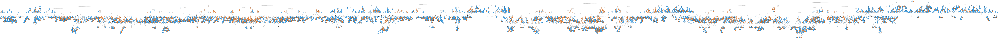

In [154]:
from sklearn.externals.six import StringIO
dot_data = StringIO()
export_graphviz(dt_Tree, out_file=dot_data,filled=True, rounded=True, special_characters=True,feature_names = features,class_names=['0','1'])
graph = pydot.graph_from_dot_data(dot_data.getvalue())
graph.write_png('dt_Tree_Sales.png')
Image(graph.create_png())

In [155]:
y_predict = dt_Tree.predict(x_test)

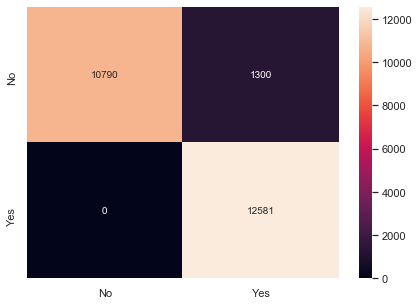

In [156]:
#Confusion matrix
cm_DT=metrics.confusion_matrix(y_test, y_predict, labels=[0, 1])
df_cm_DT = pd.DataFrame(cm_DT, index = [i for i in ["No","Yes"]],
                  columns = [i for i in ["No","Yes"]])
plt.figure(figsize = (7,5))
sns.heatmap(df_cm_DT, annot=True ,fmt='g')

In [157]:
# Check different metrics
print('Confusion Matrix')
print(confusion_matrix(y_test,y_predict))

var_recall=recall_score(y_test,y_predict)
print("Recall:",var_recall)

var_precision=precision_score(y_test,y_predict)
print("Precision:",var_precision)

var_f1=f1_score(y_test,y_predict)
print("F1 Score:",var_f1)

var_roc=roc_auc_score(y_test,y_predict)
print("Roc Auc Score:",var_roc)

var_accuracy=accuracy_score(y_test,y_predict)
print("Accuracy Score:",var_accuracy)

print(classification_report(y_test, y_predict))

Confusion Matrix
[[10790  1300]
 [    0 12581]]
Recall: 1.0
Precision: 0.9063468049852316
F1 Score: 0.9508729498904089
Roc Auc Score: 0.9462365591397849
Accuracy Score: 0.9473065542539824
              precision    recall  f1-score   support

           0       1.00      0.89      0.94     12090
           1       0.91      1.00      0.95     12581

    accuracy                           0.95     24671
   macro avg       0.95      0.95      0.95     24671
weighted avg       0.95      0.95      0.95     24671



In [158]:
tempResultsDf = pd.DataFrame({'Method':['Decision Tree'], 'Accuracy': var_accuracy, 'Recall': var_recall,'Precision': var_precision,'F1 Score': var_f1,'ROC AUC Score': var_roc})
resultsDf = pd.concat([resultsDf, tempResultsDf])
resultsDf = resultsDf[['Method', 'Accuracy','Recall','Precision','F1 Score','ROC AUC Score']]
resultsDf

,Method,Accuracy,Recall,Precision,F1 Score,ROC AUC Score
0,Logistic Regression,0.679219,0.793657,0.652486,0.716181,0.676895
0,Decision Tree,0.947307,1.000000,0.906347,0.950873,0.946237


In [159]:
#Now to prune the Decision Tree
dt_Tree_pruned = DecisionTreeClassifier(criterion = "entropy", max_depth=6)
dt_Tree_pruned.fit(x_train, y_train)

DecisionTreeClassifier(ccp_alpha=0.0, class_weight=None, criterion='entropy',
                       max_depth=6, max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, presort='deprecated',
                       random_state=None, splitter='best')

In [160]:
#Train data
print("Train: %.2f" % dt_Tree_pruned.score(x_train, y_train))
#Test data
print("Test: %.2f" % dt_Tree_pruned.score(x_test, y_test))

Train: 0.69
Test: 0.69


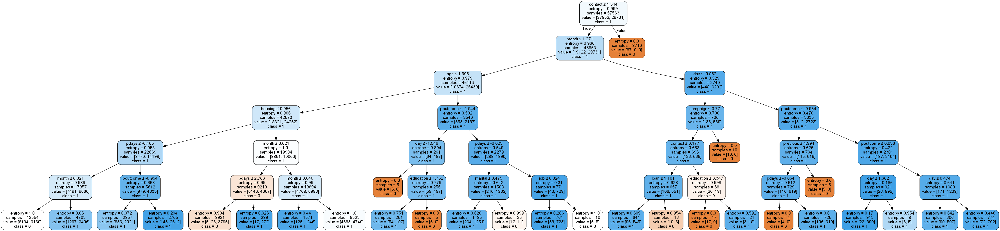

In [161]:
dot_data = StringIO()
export_graphviz(dt_Tree_pruned, out_file=dot_data,filled=True, rounded=True,
special_characters=True,feature_names = features,class_names=['0','1'])
graph = pydot.graph_from_dot_data(dot_data.getvalue())
graph.write_png('dt_Tree_Sales_Pruned.png')
Image(graph.create_png())

In [162]:
y_predict = dt_Tree_pruned.predict(x_test)

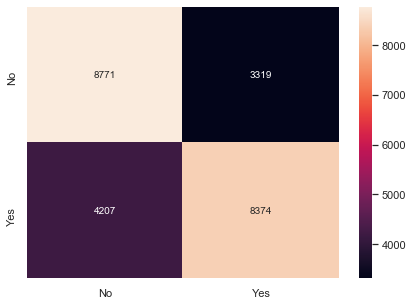

In [163]:
#Confusion matrix
Prune_cm_DT=metrics.confusion_matrix(y_test, y_predict, labels=[0, 1])
Prune_df_cm_DT = pd.DataFrame(Prune_cm_DT, index = [i for i in ["No","Yes"]],
                  columns = [i for i in ["No","Yes"]])
plt.figure(figsize = (7,5))
sns.heatmap(Prune_df_cm_DT, annot=True ,fmt='g')

In [164]:
#Check different metrics
print('Confusion Matrix')
print(confusion_matrix(y_test,y_predict))

var_recall=recall_score(y_test,y_predict)
print("Recall:",var_recall)

var_precision=precision_score(y_test,y_predict)
print("Precision:",var_precision)

var_f1=f1_score(y_test,y_predict)
print("F1 Score:",var_f1)

var_roc=roc_auc_score(y_test,y_predict)
print("Roc Auc Score:",var_roc)

var_accuracy=accuracy_score(y_test,y_predict)
print("Accuracy Score:",var_accuracy)

print(classification_report(y_test, y_predict))

Confusion Matrix
[[8771 3319]
 [4207 8374]]
Recall: 0.665606867498609
Precision: 0.7161549645086804
F1 Score: 0.6899563318777293
Roc Auc Score: 0.6955412335838784
Accuracy Score: 0.6949454825503628
              precision    recall  f1-score   support

           0       0.68      0.73      0.70     12090
           1       0.72      0.67      0.69     12581

    accuracy                           0.69     24671
   macro avg       0.70      0.70      0.69     24671
weighted avg       0.70      0.69      0.69     24671



In [165]:
#Feature importance
feat_importance = dt_Tree_pruned.tree_.compute_feature_importances(normalize=False)
feat_imp_dict = dict(zip(features, dt_Tree_pruned.feature_importances_))
feat_imp = pd.DataFrame.from_dict(feat_imp_dict, orient='index')
feat_imp.sort_values(by=0, ascending=False)

,0
contact,0.649532
month,0.152976
pdays,0.081145
age,0.043389
poutcome,0.033596
housing,0.028804
day,0.003652
education,0.002278
campaign,0.001516
previous,0.000847


In [166]:
tempResultsDf = pd.DataFrame({'Method':['Pruned Decision Tree'], 'Accuracy': var_accuracy, 'Recall': var_recall,'Precision': var_precision,'F1 Score': var_f1,'ROC AUC Score': var_roc})
resultsDf = pd.concat([resultsDf, tempResultsDf])
resultsDf = resultsDf[['Method', 'Accuracy','Recall','Precision','F1 Score','ROC AUC Score']]
resultsDf

,Method,Accuracy,Recall,Precision,F1 Score,ROC AUC Score
0,Logistic Regression,0.679219,0.793657,0.652486,0.716181,0.676895
0,Decision Tree,0.947307,1.000000,0.906347,0.950873,0.946237
0,Pruned Decision Tree,0.694945,0.665607,0.716155,0.689956,0.695541


In [167]:
#Random Forest
rfcl = RandomForestClassifier(n_estimators = 50)
rfcl = rfcl.fit(x_train, y_train)

In [168]:
#Train data
print("Train: %.2f" % rfcl.score(x_train, y_train)) 
#Test data
print("Test: %.2f" % rfcl.score(x_test, y_test))

Train: 1.00
Test: 0.97


In [169]:
y_predict = rfcl.predict(x_test)

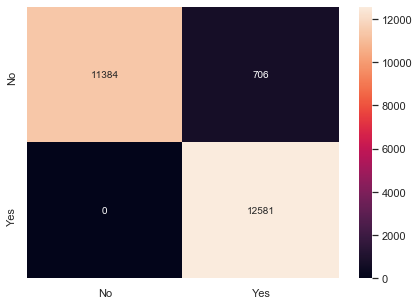

In [170]:
#Confusion matrix
RandomForest_cm_DT=metrics.confusion_matrix(y_test, y_predict, labels=[0, 1])
RandomForest_df_cm_DT = pd.DataFrame(RandomForest_cm_DT, index = [i for i in ["No","Yes"]],
                  columns = [i for i in ["No","Yes"]])
plt.figure(figsize = (7,5))
sns.heatmap(RandomForest_df_cm_DT, annot=True ,fmt='g')

In [171]:
# Check different metrics
print('Confusion Matrix')
print(confusion_matrix(y_test,y_predict))

var_recall=recall_score(y_test,y_predict)
print("Recall:",var_recall)

var_precision=precision_score(y_test,y_predict)
print("Precision:",var_precision)

var_f1=f1_score(y_test,y_predict)
print("F1 Score:",var_f1)

var_roc=roc_auc_score(y_test,y_predict)
print("Roc Auc Score:",var_roc)

var_accuracy=accuracy_score(y_test,y_predict)
print("Accuracy Score:",var_accuracy)

print(classification_report(y_test, y_predict))

Confusion Matrix
[[11384   706]
 [    0 12581]]
Recall: 1.0
Precision: 0.9468653571159781
F1 Score: 0.9727075923921448
Roc Auc Score: 0.9708023159636062
Accuracy Score: 0.971383405617932
              precision    recall  f1-score   support

           0       1.00      0.94      0.97     12090
           1       0.95      1.00      0.97     12581

    accuracy                           0.97     24671
   macro avg       0.97      0.97      0.97     24671
weighted avg       0.97      0.97      0.97     24671



In [172]:
n_estimators = [int(x) for x in np.linspace(start = 200, stop = 2000, num = 10)]

# Number of features to consider at every split
max_features = ['auto', 'sqrt']

#Maximum levels in tree
max_depth = [int(x) for x in np.linspace(10, 110, num = 11)]
max_depth.append(None)

#Minimum samples required to split a node
min_samples_split = [2, 5, 10]

#Minimum number required at each leaf node
min_samples_leaf = [1, 2, 4]

# Method of selecting samples
bootstrap = [True, False]
random_grid = {'n_estimators': n_estimators,
'max_features': max_features,
'max_depth': max_depth,
'min_samples_split': min_samples_split,
'min_samples_leaf': min_samples_leaf,
'bootstrap': bootstrap}
print(random_grid)

{'n_estimators': [200, 400, 600, 800, 1000, 1200, 1400, 1600, 1800, 2000], 'max_features': ['auto', 'sqrt'], 'max_depth': [10, 20, 30, 40, 50, 60, 70, 80, 90, 100, 110, None], 'min_samples_split': [2, 5, 10], 'min_samples_leaf': [1, 2, 4], 'bootstrap': [True, False]}


In [173]:
#To get best model
#Set n_iter to 100, Number of parameter settings that are sampled. n_iter trades off runtime vs quality of the solution.
rf = RandomForestClassifier()
rf_random = RandomizedSearchCV(estimator = rf, param_distributions = random_grid, n_iter = 100, cv = 3, verbose=2, random_state=42, n_jobs = -1)

# Fit the random search model
rf_random.fit(x_train, y_train)

Fitting 3 folds for each of 100 candidates, totalling 300 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:  1.2min
[Parallel(n_jobs=-1)]: Done 130 tasks      | elapsed:  9.9min
[Parallel(n_jobs=-1)]: Done 300 out of 300 | elapsed: 22.1min finished


RandomizedSearchCV(cv=3, error_score=nan,
                   estimator=RandomForestClassifier(bootstrap=True,
                                                    ccp_alpha=0.0,
                                                    class_weight=None,
                                                    criterion='gini',
                                                    max_depth=None,
                                                    max_features='auto',
                                                    max_leaf_nodes=None,
                                                    max_samples=None,
                                                    min_impurity_decrease=0.0,
                                                    min_impurity_split=None,
                                                    min_samples_leaf=1,
                                                    min_samples_split=2,
                                                    min_weight_fraction_leaf=0.0,
               

In [174]:
#Checking best parameters
rf_random.best_params_

{'n_estimators': 400,
 'min_samples_split': 2,
 'min_samples_leaf': 1,
 'max_features': 'sqrt',
 'max_depth': None,
 'bootstrap': False}

In [175]:
y_predict = rf_random.predict(x_test)

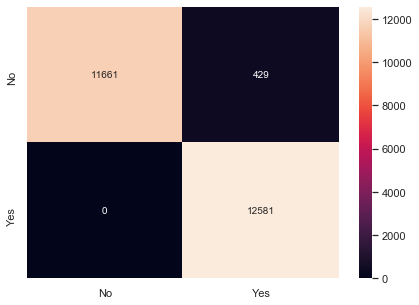

In [176]:
# Confusion matrix
Randomized_cm_DT=metrics.confusion_matrix(y_test, y_predict, labels=[0, 1])
Randomized_df_cm_DT = pd.DataFrame(Randomized_cm_DT, index = [i for i in ["No","Yes"]],columns = [i for i in ["No","Yes"]])
plt.figure(figsize = (7,5))
sns.heatmap(Randomized_df_cm_DT, annot=True ,fmt='g')

In [177]:
#Check different metrics
print('Confusion Matrix')
print(confusion_matrix(y_test,y_predict))

var_recall=recall_score(y_test,y_predict)
print("Recall:",var_recall)

var_precision=precision_score(y_test,y_predict)
print("Precision:",var_precision)

var_f1=f1_score(y_test,y_predict)
print("F1 Score:",var_f1)

var_roc=roc_auc_score(y_test,y_predict)
print("Roc Auc Score:",var_roc)

var_accuracy=accuracy_score(y_test,y_predict)
print("Accuracy Score:",var_accuracy)

print(classification_report(y_test, y_predict))

Confusion Matrix
[[11661   429]
 [    0 12581]]
Recall: 1.0
Precision: 0.9670253651037664
F1 Score: 0.9832362940096128
Roc Auc Score: 0.982258064516129
Accuracy Score: 0.9826111629038142
              precision    recall  f1-score   support

           0       1.00      0.96      0.98     12090
           1       0.97      1.00      0.98     12581

    accuracy                           0.98     24671
   macro avg       0.98      0.98      0.98     24671
weighted avg       0.98      0.98      0.98     24671



In [178]:
#Insert into result data frame
tempResultsDf = pd.DataFrame({'Method':['Random Forest'], 'Accuracy': var_accuracy, 'Recall': var_recall,'Precision': var_precision,'F1 Score': var_f1,'ROC AUC Score': var_roc})
resultsDf = pd.concat([resultsDf, tempResultsDf])
resultsDf = resultsDf[['Method', 'Accuracy','Recall','Precision','F1 Score','ROC AUC Score']]
resultsDf

,Method,Accuracy,Recall,Precision,F1 Score,ROC AUC Score
0,Logistic Regression,0.679219,0.793657,0.652486,0.716181,0.676895
0,Decision Tree,0.947307,1.000000,0.906347,0.950873,0.946237
0,Pruned Decision Tree,0.694945,0.665607,0.716155,0.689956,0.695541
0,Random Forest,0.982611,1.000000,0.967025,0.983236,0.982258


In [179]:
#Bagging
bgcl = BaggingClassifier(n_estimators=50, max_samples= .5, bootstrap=True, oob_score=True, random_state=22)
bgcl = bgcl.fit(x_train, y_train)

In [180]:
print("Train: %.2f" % bgcl.score(x_train, y_train))
print("Test: %.2f" % bgcl.score(x_test, y_test))

Train: 0.99
Test: 0.95


In [181]:
y_predict = bgcl.predict(x_test)

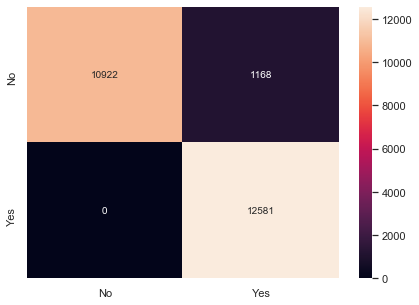

In [182]:
# Confusion matrix
Bagging_cm_DT=metrics.confusion_matrix(y_test, y_predict, labels=[0, 1])
Bagging_df_cm_DT = pd.DataFrame(Bagging_cm_DT, index = [i for i in ["No","Yes"]],columns = [i for i in ["No","Yes"]])
plt.figure(figsize = (7,5))
sns.heatmap(Bagging_df_cm_DT, annot=True ,fmt='g')

In [183]:
# Check different metrics

print('Confusion Matrix')
print(confusion_matrix(y_test,y_predict))
var_recall=recall_score(y_test,y_predict)

print("Recall:",var_recall)
var_precision=precision_score(y_test,y_predict)

print("Precision:",var_precision)
var_f1=f1_score(y_test,y_predict)

print("F1 Score:",var_f1)
var_roc=roc_auc_score(y_test,y_predict)

print("Roc Auc Score:",var_roc)
var_accuracy=accuracy_score(y_test,y_predict)

print("Accuracy Score:",var_accuracy)

print(classification_report(y_test, y_predict))

Confusion Matrix
[[10922  1168]
 [    0 12581]]
Recall: 1.0
Precision: 0.9150483671539749
F1 Score: 0.9556399544246107
Roc Auc Score: 0.9516956162117453
Accuracy Score: 0.9526569656681935

              precision    recall  f1-score   support

           0       1.00      0.90      0.95     12090
           1       0.92      1.00      0.96     12581

    accuracy                           0.95     24671
   macro avg       0.96      0.95      0.95     24671
weighted avg       0.96      0.95      0.95     24671



In [184]:
n_estimators = [int(x) for x in np.linspace(start = 200, stop = 2000, num = 10)]
bootstrap = [True, False]
random_grid = {'n_estimators': n_estimators,
'bootstrap': bootstrap}
print(random_grid)

{'n_estimators': [200, 400, 600, 800, 1000, 1200, 1400, 1600, 1800, 2000], 'bootstrap': [True, False]}


In [185]:
#To get best model 
#Set n_iter to 100, Number of parameter settings that are sampled. n_iter trades off runtime vs quality of the solution.
bgcl = BaggingClassifier()
bgcl_random = RandomizedSearchCV(estimator = bgcl, param_distributions = random_grid, n_iter = 100, cv = 3, verbose=2, random_state=42, n_jobs = -1)
bgcl_random.fit(x_train, y_train)

Fitting 3 folds for each of 20 candidates, totalling 60 fits


C:\Users\deval\anaconda3\lib\site-packages\sklearn\model_selection\_search.py:281: UserWarning: The total space of parameters 20 is smaller than n_iter=100. Running 20 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:  1.9min
[Parallel(n_jobs=-1)]: Done  60 out of  60 | elapsed: 17.5min remaining:    0.0s
[Parallel(n_jobs=-1)]: Done  60 out of  60 | elapsed: 17.5min finished


RandomizedSearchCV(cv=3, error_score=nan,
                   estimator=BaggingClassifier(base_estimator=None,
                                               bootstrap=True,
                                               bootstrap_features=False,
                                               max_features=1.0,
                                               max_samples=1.0, n_estimators=10,
                                               n_jobs=None, oob_score=False,
                                               random_state=None, verbose=0,
                                               warm_start=False),
                   iid='deprecated', n_iter=100, n_jobs=-1,
                   param_distributions={'bootstrap': [True, False],
                                        'n_estimators': [200, 400, 600, 800,
                                                         1000, 1200, 1400, 1600,
                                                         1800, 2000]},
                   pre_dispatch

In [186]:
#Checking best parameters
bgcl_random.best_params_

{'n_estimators': 1800, 'bootstrap': True}

In [187]:
#Predict
y_predict = bgcl_random.predict(x_test)

In [188]:
# Check different metrics
print('Confusion Matrix')
print(confusion_matrix(y_test,y_predict))

var_recall=recall_score(y_test,y_predict)
print("Recall:",var_recall)

var_precision=precision_score(y_test,y_predict)
print("Precision:",var_precision)

var_f1=f1_score(y_test,y_predict)
print("F1 Score:",var_f1)

var_roc=roc_auc_score(y_test,y_predict)
print("Roc Auc Score:",var_roc)

var_accuracy=accuracy_score(y_test,y_predict)
print("Accuracy Score:",var_accuracy)

print(classification_report(y_test, y_predict))

Confusion Matrix
[[11265   825]
 [    0 12581]]
Recall: 1.0
Precision: 0.9384603908697599
F1 Score: 0.9682533574479548
Roc Auc Score: 0.9658808933002481
Accuracy Score: 0.9665599286611811
              precision    recall  f1-score   support

           0       1.00      0.93      0.96     12090
           1       0.94      1.00      0.97     12581

    accuracy                           0.97     24671
   macro avg       0.97      0.97      0.97     24671
weighted avg       0.97      0.97      0.97     24671



In [189]:
#Update data frame
tempResultsDf = pd.DataFrame({'Method':['Bagging'], 'Accuracy': var_accuracy,'Recall': var_recall,'Precision': var_precision,'F1 Score': var_f1,'ROC AUC Score': var_roc})
resultsDf = pd.concat([resultsDf, tempResultsDf])
resultsDf = resultsDf[['Method', 'Accuracy','Recall','Precision','F1 Score','ROC AUC Score']]
resultsDf

,Method,Accuracy,Recall,Precision,F1 Score,ROC AUC Score
0,Logistic Regression,0.679219,0.793657,0.652486,0.716181,0.676895
0,Decision Tree,0.947307,1.000000,0.906347,0.950873,0.946237
0,Pruned Decision Tree,0.694945,0.665607,0.716155,0.689956,0.695541
0,Random Forest,0.982611,1.000000,0.967025,0.983236,0.982258
0,Bagging,0.966560,1.000000,0.938460,0.968253,0.965881


In [190]:
#Boosting
abcl = AdaBoostClassifier(n_estimators = 100, learning_rate=0.1, random_state=22)
abcl = abcl.fit(x_train, y_train)

In [191]:
print("Train: %.2f" % abcl.score(x_train, y_train))
print("Test: %.2f" % abcl.score(x_test, y_test))

Train: 0.70
Test: 0.70


In [192]:
y_predict = abcl.predict(x_test)

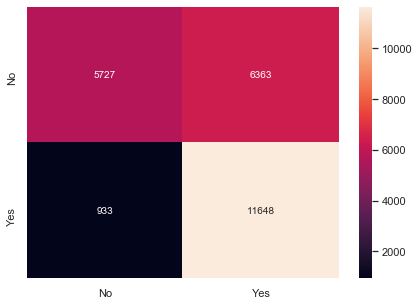

In [193]:
# Confusion matrix
Boosting_cm_DT=metrics.confusion_matrix(y_test, y_predict, labels=[0, 1])
Boosting_df_cm_DT = pd.DataFrame(Boosting_cm_DT, index = [i for i in ["No","Yes"]],columns = [i for i in ["No","Yes"]])
plt.figure(figsize = (7,5))
sns.heatmap(Boosting_df_cm_DT, annot=True ,fmt='g')

In [194]:
#Check different metrics

print('Confusion Matrix')
print(confusion_matrix(y_test,y_predict))
var_recall=recall_score(y_test,y_predict)
print("Recall:",var_recall)

var_precision=precision_score(y_test,y_predict)
print("Precision:",var_precision)

var_f1=f1_score(y_test,y_predict)
print("F1 Score:",var_f1)

var_roc=roc_auc_score(y_test,y_predict)
print("Roc Auc Score:",var_roc)

var_accuracy=accuracy_score(y_test,y_predict)
print("Accuracy Score:",var_accuracy)


print(classification_report(y_test, y_predict))

Confusion Matrix
[[ 5727  6363]
 [  933 11648]]
Recall: 0.9258405532151657
Precision: 0.6467158958414302
F1 Score: 0.7615062761506275
Roc Auc Score: 0.6997689118433149
Accuracy Score: 0.7042681691054274

              precision    recall  f1-score   support

           0       0.86      0.47      0.61     12090
           1       0.65      0.93      0.76     12581

    accuracy                           0.70     24671
   macro avg       0.75      0.70      0.69     24671
weighted avg       0.75      0.70      0.69     24671



In [195]:
n_estimators = [int(x) for x in np.linspace(start = 200, stop = 2000, num = 10)]
random_grid = {'n_estimators': n_estimators}
print(random_grid)

{'n_estimators': [200, 400, 600, 800, 1000, 1200, 1400, 1600, 1800, 2000]}


In [196]:
#To get best model 
#Set n_iter to 100, Number of parameter settings that are sampled. n_iter trades off runtime vs quality of the solution.
abcl = BaggingClassifier()
abcl_random = RandomizedSearchCV(estimator = abcl, param_distributions = random_grid, n_iter = 100, cv = 3, verbose=2, random_state=42, n_jobs = -1)
abcl_random.fit(x_train, y_train)

Fitting 3 folds for each of 10 candidates, totalling 30 fits


C:\Users\deval\anaconda3\lib\site-packages\sklearn\model_selection\_search.py:281: UserWarning: The total space of parameters 10 is smaller than n_iter=100. Running 10 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
C:\Users\deval\anaconda3\lib\site-packages\joblib\externals\loky\process_executor.py:706: UserWarning: A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.
  "timeout or by a memory leak.", UserWarning
[Parallel(n_jobs=-1)]: Done  15 out of  30 | elapsed:  4.0min remaining:  4.0min
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:  7.3min finished


RandomizedSearchCV(cv=3, error_score=nan,
                   estimator=BaggingClassifier(base_estimator=None,
                                               bootstrap=True,
                                               bootstrap_features=False,
                                               max_features=1.0,
                                               max_samples=1.0, n_estimators=10,
                                               n_jobs=None, oob_score=False,
                                               random_state=None, verbose=0,
                                               warm_start=False),
                   iid='deprecated', n_iter=100, n_jobs=-1,
                   param_distributions={'n_estimators': [200, 400, 600, 800,
                                                         1000, 1200, 1400, 1600,
                                                         1800, 2000]},
                   pre_dispatch='2*n_jobs', random_state=42, refit=True,
                   return_

In [197]:
#Predict
y_predict = abcl_random.predict(x_test)

In [198]:
# Check different metrics
print('Confusion Matrix')
print(confusion_matrix(y_test,y_predict))

var_recall=recall_score(y_test,y_predict)
print("Recall:",var_recall)

var_precision=precision_score(y_test,y_predict)
print("Precision:",var_precision)

var_f1=f1_score(y_test,y_predict)
print("F1 Score:",var_f1)

var_roc=roc_auc_score(y_test,y_predict)
print("Roc Auc Score:",var_roc)

var_accuracy=accuracy_score(y_test,y_predict)
print("Accuracy Score:",var_accuracy)


print(classification_report(y_test, y_predict))

Confusion Matrix
[[11261   829]
 [    0 12581]]
Recall: 1.0
Precision: 0.9381804623415362
F1 Score: 0.9681043438113193
Roc Auc Score: 0.9657154673283705
Accuracy Score: 0.9663977949819627
              precision    recall  f1-score   support

           0       1.00      0.93      0.96     12090
           1       0.94      1.00      0.97     12581

    accuracy                           0.97     24671
   macro avg       0.97      0.97      0.97     24671
weighted avg       0.97      0.97      0.97     24671



In [199]:
#Update data frame
tempResultsDf = pd.DataFrame({'Method':['Adaboost'], 'Accuracy': var_accuracy,
'Recall': var_recall,'Precision': var_precision,'F1 Score': var_f1,'ROC AUC Score': var_roc})
resultsDf = pd.concat([resultsDf, tempResultsDf])
resultsDf = resultsDf[['Method', 'Accuracy','Recall','Precision','F1 Score','ROC AUC Score']]
resultsDf

,Method,Accuracy,Recall,Precision,F1 Score,ROC AUC Score
0,Logistic Regression,0.679219,0.793657,0.652486,0.716181,0.676895
0,Decision Tree,0.947307,1.000000,0.906347,0.950873,0.946237
0,Pruned Decision Tree,0.694945,0.665607,0.716155,0.689956,0.695541
0,Random Forest,0.982611,1.000000,0.967025,0.983236,0.982258
0,Bagging,0.966560,1.000000,0.938460,0.968253,0.965881
0,Adaboost,0.966398,1.000000,0.938180,0.968104,0.965715


In [200]:
#From the above dataframe we can see that: 
#After performing CPU intesive RandomizedSearchCV with 100 sampled parameters
#Random Forest gives the best results with an accuracy of 98.22% with a good recall, precision, F1 score and ROC AUC
#The second best model is Bagging with accuracy of 96.58% and Adaboost wiht 96.57%